# **Homework 2 - Simplified Object Detection**

<div style="border: 3px solid #222; padding: 16px; border-radius: 10px; background-color: #1c1f26; font-family: 'Helvetica Neue', Helvetica, Arial, sans-serif; color: #e0e0e0;">
  <div style="display: flex; align-items: center; gap: 8px; margin-top: 12px;">
    <span style="font-size: 24px; color: #ff5555;">&#128274;</span>
    <span style="font-size: 16px;"><strong>Project:</strong> Homeworks</span>
  </div>
  <div style="display: flex; align-items: center; gap: 8px; margin-top: 8px;">
    <span style="font-size: 20px; color: #ff5555;">&#128218;</span>
    <span style="font-size: 16px;"><strong>Course:</strong> Deep Network Development</span>
  </div>
  <div style="margin-top: 12px; font-size: 14px;">
    <span style="font-size: 18px; color: #6e8192;">&#128100;</span>
    <span style="font-weight: bold;"><strong>Authors:</strong></span> Tamás Takács, Imre Molnár (PhD students, Department of Artificial Intelligence, Eötvös Loránd University)
  </div>
</div>
<hr style="border: none; border-top: 2px solid #444;">
<br>

<img src="https://miro.medium.com/v2/resize:fit:1400/1*hrXwIJgw51P6p1xJh_IK-g.png" alt="1" border="0">


This notebook contains the required task for the **second homework** of the **Deep Network Development (DNDEG)** course. Read the task description carefully and **fill in the empty code cells**.


# **Task Description**

You are required to **create and train a custom object detection model** to solve a simplified object detection task. Additionally, you will implement the same task using a **pre-trained YOLO model**.  

To achieve this, you will first **generate a synthetic dataset** by placing a specific object onto a set of background images. This dataset will be used for training both models. Since this is a **simplified object detection problem**, each image should contain **only a single object**, ensuring a controlled training environment.  

Your goal is to **train a custom object detection model from scratch** and later **fine-tune a pre-trained YOLO model** using the same dataset.

## **Expectations**

- While **high performance is not expected**, your model should **perform better than random guessing**, and the **loss should consistently decrease across epochs**.  

- You should structure your dataset using the **YOLO format for bounding box regression** (`<class_id> <x_center> <y_center> <width> <height>`), where:

  - `<class_id>` is the object class label (an integer starting from 0).
  - `<x_center>` and `<y_center>` are the normalized coordinates (values between 0 and 1) of the bounding box center.
  - `<width>` and `<height>` are the normalized dimensions (values between 0 and 1) of the bounding box relative to the image size.

ensuring that the same dataset can be seamlessly used for fine-tuning a **pre-trained YOLO model**.

- Your evaluation should include key metrics such as **precision, recall, F1-score, mAP (mean average precision), and IoU (Intersection over Union)**, along with monitoring the overall loss trends throughout training. These metrics should be **visualized using plots and graphs** (e.g., with **matplotlib** or **seaborn**) to illustrate performance over time.  

- To prevent overfitting, you should implement techniques such as **Early Stopping** and ensure that the **best-performing model is saved** during training.  

- For better experiment tracking and visualization, consider using **WandB (Weights and Biases)** or **TensorBoard** to log training progress, performance metrics, and model improvements in real time.  
  
## **Requirements**

You will be required to choose at least three different objects that you would like to run object detection on. For the background images, you are free to use anything thematic and download images utilizing a web crawler. A simple example could be `Waldo`, `Wilma`, and `Wenda`, with the background images being *Where’s Waldo?* doodles.

- Data Visualization:
  - Display **your chosen objects with the background removed**.
  - Display **a few of your background images**.
  - Visualize the **synthetic dataset**, where each image should contain a background with an object placed onto it, along with a bounding box and class label.

- Performance Monitoring:
  - **Visualize training and validation losses** (classification loss, regression loss) after training the network.
  - Use **plots and metrics** (e.g., matplotlib, seaborn) to display performance trends.

- Implement overfitting prevention techniques, such as:
  - **Early stopping**
  - **Regularization techniques** (e.g., dropout, weight decay)
  - **Experimenting with different loss functions**
  - Save the **best-performing model** during training.

- Evaluate model performance:
  - **Visualize predictions** on a batch of test images.
  - Calculate **precision, recall, F1-score, mAP, and IoU** for the test dataset.

- Fine-Tuning YOLO:
  - Fine-tune a **YOLO nano** model (**version 5 or later**) on your object detection task.
  - Evaluate model performance using the **same metrics** as before.

- Optionally, use WandB (Weights and Biases) or TensorBoard to:
  - Track and visualize **training progress**.
  - Monitor **model performance** over time.
  - Log **key metrics**.


> **NOTE:** A **multi-shot object detector is unnecessary** since you are dealing with **single-object detection**, for which a simple bounding box regression and classification head will suffice. Implementing `Non-Maximum Suppression` is also **not required** due to the single-object constraint. If you’re feeling adventurous, you could extend this homework to multi-object detection using a single-shot approach for a **+1 improvement to your grade**!

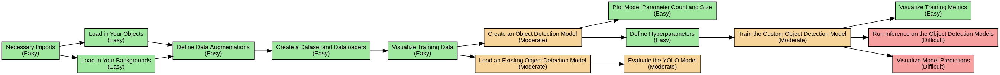

In [35]:
# @title Custom Object Detection Tasks
# %%capture flowchart_output
# HIDDEN CELL
from graphviz import Digraph
from IPython.display import Image as IMG

def create_flowchart(output_filename='flowchart'):
    dot = Digraph(name='Simplified Object Detection', format='png')
    dot.attr(rankdir='LR')
    dot.attr('node', shape='box', style='filled', fontsize='12', fontname='Arial')

    dot.node('Imports', 'Necessary Imports\n(Easy)', fillcolor='#A0E7A0')

    dot.node('LoadObjects', 'Load in Your Objects\n(Easy)', fillcolor='#A0E7A0')
    dot.node('LoadBackgrounds', 'Load in Your Backgrounds\n(Easy)', fillcolor='#A0E7A0')

    dot.node('AugmentData', 'Define Data Augmentations\n(Easy)', fillcolor='#A0E7A0')
    dot.node('DatasetDataloader', 'Create a Dataset and Dataloaders\n(Easy)', fillcolor='#A0E7A0')

    dot.node('VisualizeSample', 'Visualize Training Data\n(Easy)', fillcolor='#A0E7A0')

    dot.node('CreateModel', 'Create an Object Detection Model\n(Moderate)', fillcolor='#F6D49A')

    dot.node('TorchSummary', 'Plot Model Parameter Count and Size\n(Easy)', fillcolor='#A0E7A0')
    dot.node('Hyperparameters', 'Define Hyperparameters\n(Easy)', fillcolor='#A0E7A0')

    dot.node('TrainModel', 'Train the Custom Object Detection Model\n(Moderate)', fillcolor='#F6D49A')

    dot.node('VisualizeTrain', 'Visualize Training Metrics\n(Easy)', fillcolor='#A0E7A0')
    dot.node('RunInference', 'Run Inference on the Object Detection Models\n(Difficult)', fillcolor='#F6A0A0')
    dot.node('VisPred', 'Visualize Model Predictions\n(Difficult)', fillcolor='#F6A0A0')


    dot.node('LoadYOLO', 'Load an Existing Object Detection Model\n(Moderate)', fillcolor='#F6D49A')

    dot.node('EvalYOLO', 'Evaluate the YOLO Model\n(Moderate)', fillcolor='#F6D49A')

    # Edges
    dot.edge('Imports', 'LoadObjects')
    dot.edge('Imports', 'LoadBackgrounds')

    dot.edge('LoadObjects', 'AugmentData')
    dot.edge('LoadBackgrounds', 'AugmentData')

    dot.edge('AugmentData', 'DatasetDataloader')

    dot.edge('DatasetDataloader', 'VisualizeSample')

    dot.edge('VisualizeSample', 'CreateModel')

    dot.edge('CreateModel', 'TorchSummary')
    dot.edge('CreateModel', 'Hyperparameters')

    dot.edge('Hyperparameters', 'TrainModel')

    dot.edge('TrainModel', 'VisualizeTrain')
    dot.edge('TrainModel', 'RunInference')
    dot.edge('TrainModel', 'VisPred')

    dot.edge('VisualizeSample', 'LoadYOLO')
    dot.edge('LoadYOLO', 'EvalYOLO')

    dot.render(output_filename, view=False)

create_flowchart('homework2_flowchart')
IMG('homework2_flowchart.png')

Each section of the Notebook will guide you through the task:
- `necessary imports`
- `loading in chosen objects`
- `crawling the web for background images`
- `creating a synthetic dataset`
- `creating dataloaders`
- `visualizing the training data`
- `creating a custom model for object detection`
- `defining a loss function and an optimizer`
- `training and validating the custom model`
- `testing the custom model`
- `fine-tuning a YOLO model`
- `evaluating YOLO results`

The sections are there to guide you but you **do not have to follow them strictly**.

Copy this notebook to your drive (`File -> Save a copy in Drive`), edit it, and upload the final `.ipynb` file to [Canvas](https://canvas.elte.hu). If you are using this in **Google Colab**, save it as `.ipynb` and upload it, or share the public link. If you have your own machine with Jupyter installed, you can work there as well, as long as you save and upload the `.ipynb` file.

## **General Rules**
Please check all the requirements listed on **Canvas**, but here are some general rules:

- **No NSFW, inappropriate, offensive, or negative images**. Be creative or use your hobbies as inspiration.
- The model is **not expected to achieve high performance** but must perform better than random guessing.
- Copying others' code will make you fail the assignment automatically, resulting in a **0**.
- Not submitting anything results in a **0**.
- Submitting something, as long as it is not an empty notebook, might result in a 1.
- **Deadline is April 3th Friday 11:59 PM** (strict, no late submission)
- Feel free to add more code cells as needed. But don't put code into external Python files.
- Please add your `name` and `Neptun ID` below.

`Good luck!`

## **Guidelines**
Please carefully read each cell of the notebook, as they contain guidelines to help you complete the assignments. While you don't have to follow them strictly, we believe that they provide enough help.

**Name:** BENLALA

**Neptun ID:** RAID_ATHMANE

## **0. Necessary Imports**
Import all the necessary packages for this assignment. **ONLY PYTORCH MODELS ARE ACCEPTED!**

In [36]:
import torch
import os
import numpy as np
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from torch import nn
from torch.utils.data import Dataset
from torch.utils.data import DataLoader

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

## **1.1 Object Loading Process**

For this assignment you might choose 3 of the [Where's Wally Characters](https://waldo.fandom.com/wiki/Category:Characters).


<img src='https://kotaksuratriza.wordpress.com/wp-content/uploads/2012/06/wally-and-friends.jpg' />

**Please select 3 or more objects.** After selecting the objects, **remove the background, keeping only the object itself**. You can do this manually, online, or by using code (this step is not part of the assignment evaluation).

As an example, the following objects were chosen (with the background removed using the Segment Anything Model). **Make sure to visualize all of your objects** with `Matplotlib` or `Seaborn`!

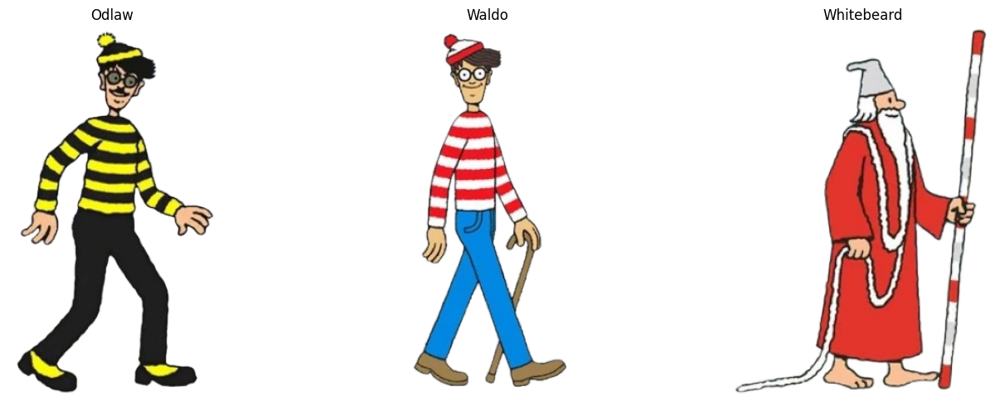

In [3]:
# ADD YOUR CODE HERE
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
# Loading the object images
odlaw = np.array(Image.open('/kaggle/input/images/odlaw.png'))
waldo = np.array(Image.open('/kaggle/input/images/waldo.png'))
whitebeard = np.array(Image.open('/kaggle/input/images/whitebeard.png'))

# Create a figure with subplots
plt.figure(figsize=(15, 5))

# Plot each object
plt.subplot(1, 3, 1)
plt.imshow(odlaw)
plt.title('Odlaw')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(waldo)
plt.title('Waldo')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(whitebeard)
plt.title('Whitebeard')
plt.axis('off')

# Adjust layout and display
plt.tight_layout()
plt.show()

## **1.2 Crawling the Web for Background Images**

To train a custom object detection model, a dataset is required. For this assignment, you will create a **synthetic dataset** by:  

- **Placing a single object at a random position** on a background image.  

The goal is to follow a similar approach to **Where’s Waldo doodles** by embedding objects into cluttered backgrounds. **Therefore, gather a selection of background images from various doodles.** This can be done manually or programmatically.  

To automate image collection, it is recommended to use `icrawler`. [Documentation](https://icrawler.readthedocs.io/en/latest/)

In [4]:
!pip install icrawler

In [37]:
!mkdir /kaggle/working/background

mkdir: cannot create directory ‘/kaggle/working/background’: File exists


In case of any **errors, try using a different crawler**. You can use one of the following options:

```python
from icrawler.builtin import BaiduImageCrawler, BingImageCrawler, GoogleImageCrawler


In [38]:
from icrawler.builtin import GoogleImageCrawler

google_crawler = GoogleImageCrawler(
    parser_threads=2,
    downloader_threads=4,
    storage={'root_dir': '/kaggle/working/background'}
)

for keyword in ['doodle background', 'cluttered doodle background', 'colorful doodle backgroun', 'waldo doodle background']:
    google_crawler.crawl(keyword=keyword, max_num=100, file_idx_offset='auto')

# Some images may return an error, but icrawler tries to find other images regardless

Make sure to **visualize a small subset of the background images as well**!
```python
def display_sample_images(directory):
  raise NotImplementedError
```

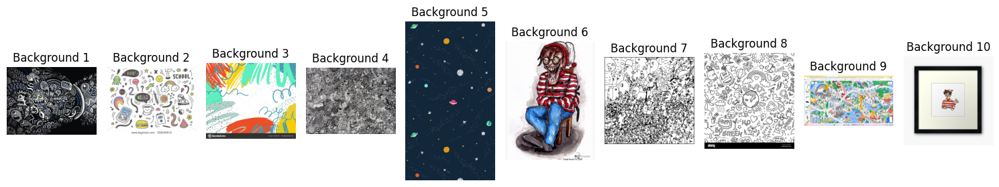

In [7]:
import os
# ADD YOUR CODE HERE
def display_sample_images(directory):
    """
    Display a sample of background images from the specified directory.

    Args:
    directory (str): Path to the directory containing background images
    num_images (int): Number of images to display
    """
    num_images=10
    # Get list of image files
    image_files = [f for f in os.listdir(directory)
                   if f.lower().endswith(('.png', '.jpg', '.jpeg', '.gif'))]

    # Randomly select images
    import random
    sample_images = random.sample(image_files, min(num_images, len(image_files)))

    # Create figure
    plt.figure(figsize=(15, 5))

    # Display images
    for i, img_name in enumerate(sample_images, 1):
        img_path = os.path.join(directory, img_name)
        img = plt.imread(img_path)

        plt.subplot(1, num_images, i)
        plt.imshow(img)
        plt.title(f'Background {i}')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Visualize sample background images
display_sample_images('background')

## **2. Creating a Synthetic Dataset**

This is a crucial part of the assignment evaluation. Using the selected objects and collected background images, follow these steps to generate your dataset:  

1. **Randomly select background images** from your dataset.  
2. **Place a single object** from your selected set into each background image at a **random location**.  
3. **Record the object's coordinates** and create a corresponding bounding box. The format should be:  
   - If an object with height $h$ and width $w$ is positioned at $(x, y)$, the bounding box should follow:  
     $$ [x_{\text{center}}, y_{\text{center}}, \text{width}, \text{height}] $$  
   - Normalize the values using:  
     $$ \left[\frac{x + w/2}{\text{image width}}, \frac{y + h/2}{\text{image height}}, \frac{w}{\text{image width}}, \frac{h}{\text{image height}}\right] $$  
     where *image* refers to the background image dimensions.  
4. **Save the generated dataset**, as it will be used for training both your custom model and fine-tuning an existing object detection model.  
5. **Wrap the dataset creation** within a PyTorch `Dataset` class for seamless data handling and model training.  
6. **Split the dataset** into training, validation, and test sets to ensure proper model evaluation.
7. **Apply various transformations** on the training and validation datasets. Only apply **tensor conversion and normalization** on the test set.

<img src="https://i.ibb.co/XrHqLmz4/2.png" alt="2" border="0">

```python
def createDataset(root_dir, dataset_name, split, img_size, num_images):
    #This my own function... It creates and saves a dataset in the following format:
    # root/
    #     dataset/
    #             train/
    #                   images/
    #                         00001.jpg
    #                   labels/
    #                         00001.txt with the content [class yolo_x, yolo_y, yolo_w, yolo_h] following the yolo format
    #             val
    #...
    # ADD YOUR CODE HERE
    raise NotImplementedError

createDataset('dataset', 'background', split='train', img_size=(640,640), num_images=5000)
createDataset('dataset', 'background', split='val', img_size=(640,640), num_images=1000)
createDataset('dataset', 'background', split='test', img_size=(640,640), num_images=200)
```

```python
class ObjectDetectionDataset(Dataset):
    def __init__(self, root_dir, split, num_classes, transform):
        raise NotImplementedError
    def __len__(self):
        raise NotImplementedError
    def __getitem__(self, idx):
        raise NotImplementedError
```

In [39]:
# ADD YOUR CODE HERE
import random
from torch.utils.data import Dataset

def createDataset(root_dir, dataset_name, split, img_size=(640, 640), num_images=5000):
    """
    Create a synthetic object detection dataset with YOLO-compatible structure.

    Args:
    - root_dir (str): Root directory to save the dataset
    - dataset_name (str): Name of the dataset
    - split (str): Dataset split (train/val/test)
    - img_size (tuple): Target image size
    - num_images (int): Number of images to generate
    """
    # Prepare directories
    dataset_path = os.path.join(root_dir, dataset_name, split)
    images_dir = os.path.join(dataset_path, 'images')
    labels_dir = os.path.join(dataset_path, 'labels')
    os.makedirs(images_dir, exist_ok=True)
    os.makedirs(labels_dir, exist_ok=True)

    # Load background and object images
    background_images = [os.path.join('background', f) for f in os.listdir('background')
                         if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    object_images = ['/kaggle/input/images/odlaw.png', '/kaggle/input/images/waldo.png', '/kaggle/input/images/whitebeard.png']

    # Generate synthetic images
    for i in range(num_images):
        # Select random background and object
        bg_path = random.choice(background_images)
        obj_path = random.choice(object_images)

        # Load images
        bg = Image.open(bg_path).convert('RGB')
        obj = Image.open(obj_path).convert('RGBA')

        # Resize background and object
        bg = bg.resize(img_size)
        obj_aspect = obj.size[0] / obj.size[1]
        new_obj_width = int(min(img_size) * 0.3)
        new_obj_height = int(new_obj_width / obj_aspect)
        obj = obj.resize((new_obj_width, new_obj_height))

        # Random position
        x = random.randint(0, img_size[0] - new_obj_width)
        y = random.randint(0, img_size[1] - new_obj_height)

        # Create a copy of background to paste object
        synthetic_img = bg.copy()
        synthetic_img.paste(obj, (x, y), obj)

        # Calculate normalized YOLO format bounding box
        x_center = (x + new_obj_width/2) / img_size[0]
        y_center = (y + new_obj_height/2) / img_size[1]
        width = new_obj_width / img_size[0]
        height = new_obj_height / img_size[1]

        # Determine class (0: Odlaw, 1: Waldo, 2: Whitebeard)
        class_id = [os.path.basename(path) for path in object_images].index(os.path.basename(obj_path))

        # Save synthetic image
        img_filename = f'{i:05d}.jpg'
        img_path = os.path.join(images_dir, img_filename)
        synthetic_img.save(img_path)

        # Save label
        label_filename = f'{i:05d}.txt'
        label_path = os.path.join(labels_dir, label_filename)
        with open(label_path, 'w') as f:
            f.write(f'{class_id} {x_center} {y_center} {width} {height}')

    print(f'Created {num_images} synthetic images for {split} split')

class ObjectDetectionDataset(Dataset):
    def __init__(self, root_dir, split, num_classes=3, transform=None):
        """
        Initialize Object Detection Dataset

        Args:
        - root_dir (str): Root directory of the dataset
        - split (str): Dataset split (train/val/test)
        - num_classes (int): Number of object classes
        - transform (callable, optional): Optional transform to be applied on a sample
        """
        self.root_dir = root_dir
        self.split = split
        self.num_classes = num_classes

        # Paths
        self.images_dir = os.path.join(root_dir, 'background', split, 'images')
        self.labels_dir = os.path.join(root_dir, 'background', split, 'labels')

        # Get image and label filenames
        self.images = sorted(os.listdir(self.images_dir))
        self.labels = sorted(os.listdir(self.labels_dir))

        # Default transforms
        if transform is None:
            self.transform = transforms.Compose([
                transforms.ToTensor(),
                transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std=[0.229, 0.224, 0.225])
            ])
        else:
            self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        # Load image
        img_path = os.path.join(self.images_dir, self.images[idx])
        image = Image.open(img_path).convert('RGB')

        # Load label
        label_path = os.path.join(self.labels_dir, self.labels[idx])
        with open(label_path, 'r') as f:
            label = list(map(float, f.read().split()))

        # Transform image
        if self.transform:
            image = self.transform(image)

        return image, torch.tensor(label)

# Create dataset splits
createDataset('dataset', 'background', split='train', img_size=(640, 640), num_images=5000)
createDataset('dataset', 'background', split='val', img_size=(640, 640), num_images=1000)
createDataset('dataset', 'background', split='test', img_size=(640, 640), num_images=200)

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:1054: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Created 5000 synthetic images for train split
Created 1000 synthetic images for val split
Created 200 synthetic images for test split


## **3. Creating Dataloaders**

For the **DataLoader**, ensure that the **batch size** is appropriate so that it fits into memory. Set the **`shuffle`** parameter as follows:

- **Training & Validation DataLoaders:** `shuffle=True` (to randomize the order of samples)  
- **Test DataLoader:** `shuffle=False` (to maintain consistency in evaluation)

In [40]:
import torch
from torch.utils.data import DataLoader

def create_dataloaders(root_dir, batch_size=32, num_workers=4):
    """
    Create DataLoaders for train, validation, and test splits.

    Args:
    - root_dir (str): Root directory of the dataset
    - batch_size (int): Number of samples per batch
    - num_workers (int): Number of subprocesses to use for data loading

    Returns:
    - tuple: (train_loader, val_loader, test_loader)
    """
    # Create dataset instances for each split
    train_dataset = ObjectDetectionDataset(root_dir, split='train')
    val_dataset = ObjectDetectionDataset(root_dir, split='val')
    test_dataset = ObjectDetectionDataset(root_dir, split='test')

    # Create DataLoaders
    train_loader = DataLoader(
        train_dataset, 
        batch_size=batch_size, 
        shuffle=True,  # Randomize order for training
        num_workers=num_workers,
        pin_memory=True  # Faster data transfer to CUDA
    )

    val_loader = DataLoader(
        val_dataset, 
        batch_size=batch_size, 
        shuffle=True,  # Randomize order for validation
        num_workers=num_workers,
        pin_memory=True
    )

    test_loader = DataLoader(
        test_dataset, 
        batch_size=batch_size, 
        shuffle=False,  # Maintain consistent order for testing
        num_workers=num_workers,
        pin_memory=True
    )

    return train_loader, val_loader, test_loader

# Example usage
root_dir = '/kaggle/working/dataset/'
train_loader, val_loader, test_loader = create_dataloaders(root_dir)

# Optional: Print out some information about the loaders
print(f"Train loader: {len(train_loader)} batches")
print(f"Validation loader: {len(val_loader)} batches")
print(f"Test loader: {len(test_loader)} batches")

Train loader: 157 batches
Validation loader: 32 batches
Test loader: 7 batches


## **4. Visualizing the Training Data**

To visualize the training data, extract a batch from the training `DataLoader` and plot the **input images with their respective bounding box and class label** using `Matplotlib` or `Seaborn`. Ensure that at least **8 datapoints** are displayed for a clear representation.

```python
def visualize_batch():
  raise NotImplementedError
```

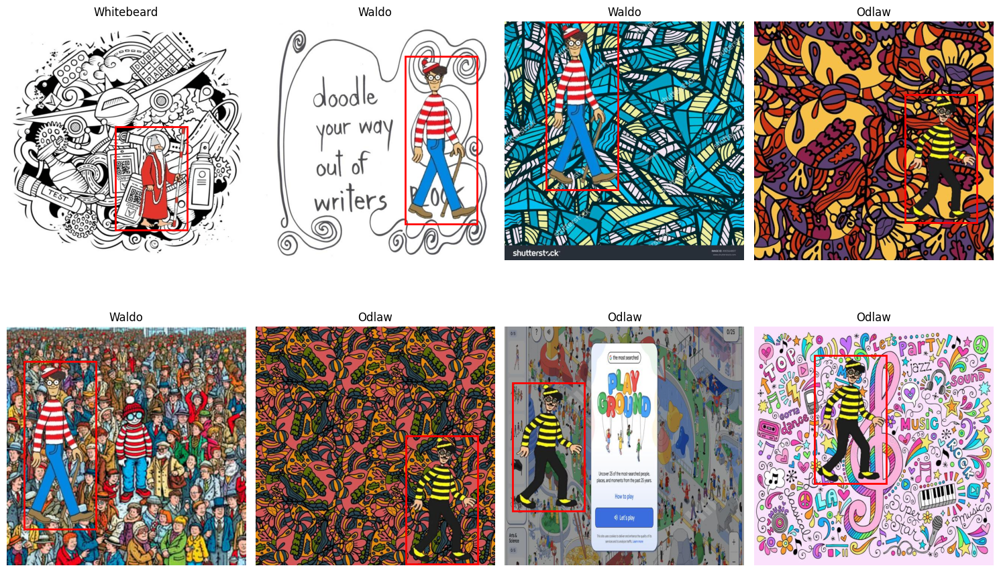

In [10]:
# ADD YOUR CODE HERE

def visualize_batch(dataset, num_samples=8):
    """
    Visualize a batch of training images with bounding boxes and class labels.

    Args:
    - dataset: PyTorch Dataset
    - num_samples: Number of samples to display
    """
    # Create a DataLoader
    dataloader = DataLoader(dataset, batch_size=num_samples, shuffle=True)

    # Reverse normalization transform
    reverse_normalize = transforms.Normalize(
        mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
        std=[1/0.229, 1/0.224, 1/0.225]
    )

    # Class names
    class_names = ['Odlaw', 'Waldo', 'Whitebeard']

    # Get a batch of images and labels
    images, labels = next(iter(dataloader))

    # Create figure
    plt.figure(figsize=(15, 10))

    for i in range(num_samples):
        # Reverse normalization
        img = reverse_normalize(images[i])

        # Prepare subplot
        plt.subplot(2, 4, i+1)

        # Convert to numpy and transpose dimensions for matplotlib
        img_np = img.permute(1, 2, 0).numpy()

        # Plot image
        plt.imshow(img_np)

        # Extract bounding box details
        class_id, x_center, y_center, width, height = labels[i]

        # Convert normalized coordinates back to pixel coordinates
        img_height, img_width = img_np.shape[:2]
        x = (x_center - width/2) * img_width
        y = (y_center - height/2) * img_height
        box_width = width * img_width
        box_height = height * img_height

        # Draw bounding box
        rect = plt.Rectangle(
            (x, y),
            box_width,
            box_height,
            fill=False,
            edgecolor='red',
            linewidth=2
        )
        plt.gca().add_patch(rect)

        # Add class label
        plt.title(f'{class_names[int(class_id)]}')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Create dataset
dataset = ObjectDetectionDataset(
    root_dir='dataset',
    split='train',
    transform=transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )
    ])
)

# Visualize batch
visualize_batch(dataset)

## **5. Creating a Custom Object Detection Model**

In this assignment, you are tasked with building your own custom object detection model.

Design a CNN-based architecture that includes a **backbone for feature extraction** and **two output branches**:

- One for **class probabilities** (with output size equal to the number of object classes, e.g., 3).
- Another for **bounding box regression** (with size 4 for the box coordinates: $[x_{center}, y_{center}, width, height]$).

This is the **core evaluation of the assignment**. Experiment with different layers, hyperparameters, and regularization techniques to optimize the model's performance.

> **Note**: You **ARE** allowed to use a pre-trained backbone (`VGG`, `ResNet`) for this task. You are free to fine-tune the pre-trained backbone or just freeze is completely.

```python
class CustomModel(nn.Module):
    def __init__(self, num_classes=3):
        super(CustomModel, self).__init__()
        raise NotImplementedError

    def forward(self, x):
        raise NotImplementedError
```

In [11]:
# ADD YOUR CODE HERE

import torchvision.models as models
class CustomModel(nn.Module):
    def __init__(self, num_classes=3, pretrained=True):
        """
        Custom Object Detection Model with ResNet Backbone

        Args:
        - num_classes (int): Number of object classes
        - pretrained (bool): Use pretrained weights for backbone
        """
        super(CustomModel, self).__init__()

        # Use ResNet18 as backbone
        backbone = models.resnet18(pretrained=pretrained)

        # Remove the last fully connected layer
        self.backbone = nn.Sequential(*list(backbone.children())[:-2])

        # Freeze backbone weights (optional)
        for param in self.backbone.parameters():
            param.requires_grad = False

        # Global Average Pooling
        self.global_pool = nn.AdaptiveAvgPool2d(1)

        # Classification branch
        self.cls_branch = nn.Sequential(
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(256, num_classes)
        )

        # Bounding box regression branch
        self.bbox_branch = nn.Sequential(
            nn.Linear(512, 256),
            nn.BatchNorm1d(256),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(256, 4)  # [x_center, y_center, width, height]
        )

    def forward(self, x):
        """
        Forward pass of the model

        Args:
        - x (tensor): Input image batch

        Returns:
        - cls_output (tensor): Class probabilities
        - bbox_output (tensor): Bounding box coordinates
        """
        # Extract features using backbone
        features = self.backbone(x)

        # Global average pooling
        pooled_features = self.global_pool(features).squeeze(-1).squeeze(-1)

        # Classification branch
        cls_output = self.cls_branch(pooled_features)

        # Bounding box regression branch
        bbox_output = self.bbox_branch(pooled_features)

        return cls_output, bbox_output

# Example usage and model summary
model = CustomModel(num_classes=3)
x = torch.randn(4, 3, 640, 640)  # Example input batch
cls_out, bbox_out = model(x)

print("Model Summary:")
print(f"Input Shape: {x.shape}")
print(f"Classification Output Shape: {cls_out.shape}")
print(f"Bounding Box Output Shape: {bbox_out.shape}")

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 217MB/s]


Model Summary:
Input Shape: torch.Size([4, 3, 640, 640])
Classification Output Shape: torch.Size([4, 3])
Bounding Box Output Shape: torch.Size([4, 4])


## **6.1 Plotting Model Parameter Count and Size**

A convenient way to inspect the number of parameters in a defined `nn.Module` is by using the `torchsummary` package. This package provides a detailed summary of the model architecture, including the number of parameters in each layer, their shapes, and the total parameter count.

To use `torchsummary`, you need to pass a dummy tensor with the specified input shape. The package will then traverse the model, layer by layer, calculating the total number of trainable and non-trainable parameters while also displaying the output shapes at each stage.

Sumnmarize **both models**!

```python
model = CustomModel().to(device)
summary(model, input_size = )
```

In [12]:
# ADD YOUR CODE HERE
from torchsummary import summary

# Custom Model Summary
model = CustomModel().to(device)
print("Custom Model Parameter Summary:")
summary(model, input_size=(3, 640, 640))

Custom Model Parameter Summary:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 320, 320]           9,408
       BatchNorm2d-2         [-1, 64, 320, 320]             128
              ReLU-3         [-1, 64, 320, 320]               0
         MaxPool2d-4         [-1, 64, 160, 160]               0
            Conv2d-5         [-1, 64, 160, 160]          36,864
       BatchNorm2d-6         [-1, 64, 160, 160]             128
              ReLU-7         [-1, 64, 160, 160]               0
            Conv2d-8         [-1, 64, 160, 160]          36,864
       BatchNorm2d-9         [-1, 64, 160, 160]             128
             ReLU-10         [-1, 64, 160, 160]               0
       BasicBlock-11         [-1, 64, 160, 160]               0
           Conv2d-12         [-1, 64, 160, 160]          36,864
      BatchNorm2d-13         [-1, 64, 160, 160]             128
       

## **6.2 Defining Loss Function and Optimizer**

**Loss Functions and their options:**

For our custom object detection task, we are performing both **regression** (for bounding box coordinates) and **classification** (for object categories). Our network predicts **continuous** bounding box values, along with a **discrete** class label, meaning that our chosen loss function should effectively be a composite of two losses:  

1. **A regression loss** for bounding box prediction.  
2. **A classification loss** for object label prediction.  

Here are some common loss functions that can be used:  

---

### **a. Mean Squared Error (MSE) Loss** (Bounding Box Regression)  
MSE loss is a standard choice for regression tasks, as it penalizes larger errors more strongly than smaller ones. For bounding box prediction, this ensures that predicted box coordinates are as close as possible to the ground truth.  

$$
\mathcal{L}_{MSE} = \frac{1}{N} \sum_{i=1}^{N} (y_i - \hat{y}_i)^2
$$  

where $ y_i $ is the ground truth bounding box coordinate and $ \hat{y}_i $ is the predicted coordinate.  

- **Pros:** Simple, computationally efficient, commonly used in regression tasks.  
- **Cons:** Sensitive to outliers since it squares errors, which may cause instability when predicting bounding boxes.  

---

### **b. Cross-Entropy Loss (Classification Loss)**  
For predicting object classes, **Cross-Entropy Loss** is the most commonly used loss function in classification tasks. It is defined as:  

$$
\mathcal{L}_{CE} = -\sum_{i=1}^{C} y_i \log(\hat{y}_i)
$$  

where $ C $ is the total number of object classes, $ y_i $ is the ground truth label (one-hot encoded), and $ \hat{y}_i $ is the predicted probability for that class.  

- **Pros:** Standard for classification, provides well-calibrated probabilities.  
- **Cons:** Can be affected by class imbalances; label smoothing or weighted loss may be needed.  

---

### **c. Huber Loss (Smooth Bounding Box Regression Loss)**  
Huber Loss is an improvement over MSE that reduces sensitivity to outliers. It applies MSE for small errors and Mean Absolute Error (MAE) for larger errors:  

$$
\mathcal{L}_{Huber} =
\begin{cases}
\frac{1}{2} (y_i - \hat{y}_i)^2, & \text{if} \ |y_i - \hat{y}_i| \leq \delta \\
\delta (|y_i - \hat{y}_i| - \frac{1}{2} \delta), & \text{otherwise}
\end{cases}
$$  

where $ \delta $ is a threshold that determines when the loss transitions from quadratic to linear.  

- **Pros:** More robust than MSE, reduces the effect of outliers on bounding box predictions.  
- **Cons:** Requires tuning of $ \delta $ for optimal performance.  

---

### **d. Intersection over Union (IoU) Loss (Bounding Box Alignment Loss)**  
IoU Loss directly optimizes the overlap between the predicted and ground-truth bounding boxes:  

$$
\mathcal{L}_{IoU} = 1 - \frac{\text{Intersection Area}}{\text{Union Area}}
$$  

This loss ensures that the model prioritizes bounding box alignment rather than just minimizing coordinate differences.  

- **Pros:** More appropriate for object detection since it directly optimizes box overlap.  
- **Cons:** Harder to optimize, as gradients may vanish when boxes do not overlap.  

---

[PyTorch Documentation](https://pytorch.org/docs/stable/nn.html#loss-functions)

---

**Optimizers and their options:**

There are some pre-built [Optimizers in PyTorch](https://pytorch.org/docs/stable/optim.html), they are sufficient in most cases, especially if their parameters are well set. The two most well-known are Adam (AdamW) and SGD, both of which originate from Gradient Descent, which we implemented earlier.

* **S**tochastic **G**radient **D**escent ([SGD](https://pytorch.org/docs/stable/generated/torch.optim.SGD.html))
* **ADA**ptive **M**oment optimizer ([ADAM](https://pytorch.org/docs/stable/generated/torch.optim.Adam.html))
* [A good general overview](https://www.ruder.io/optimizing-gradient-descent/)

In [13]:
# ADD YOUR CODE HERE

import torch.optim as optim

class CustomLoss(nn.Module):
    def __init__(self, bbox_loss_type='mse', cls_loss_type='cross_entropy'):
        """
        Composite loss function for object detection

        Args:
        - bbox_loss_type (str): Type of bounding box regression loss
        - cls_loss_type (str): Type of classification loss
        """
        super(CustomLoss, self).__init__()

        # Bounding Box Regression Loss
        if bbox_loss_type == 'mse':
            self.bbox_loss = nn.MSELoss()
        elif bbox_loss_type == 'huber':
            self.bbox_loss = nn.SmoothL1Loss()
        else:
            raise ValueError(f"Unsupported bbox loss type: {bbox_loss_type}")

        # Classification Loss
        if cls_loss_type == 'cross_entropy':
            self.cls_loss = nn.CrossEntropyLoss()
        else:
            raise ValueError(f"Unsupported classification loss type: {cls_loss_type}")

        # Hyperparameters for loss weighting
        self.bbox_weight = 1.0
        self.cls_weight = 1.0

    def forward(self, pred_bbox, true_bbox, pred_cls, true_cls):
        """
        Compute composite loss

        Args:
        - pred_bbox (tensor): Predicted bounding box coordinates
        - true_bbox (tensor): Ground truth bounding box coordinates
        - pred_cls (tensor): Predicted class probabilities
        - true_cls (tensor): Ground truth class labels

        Returns:
        - total_loss (tensor): Weighted sum of bbox and classification losses
        """
        # Compute bounding box regression loss
        bbox_loss = self.bbox_loss(pred_bbox, true_bbox)

        # Compute classification loss
        cls_loss = self.cls_loss(pred_cls, true_cls)

        # Weighted total loss
        total_loss = (self.bbox_weight * bbox_loss +
                      self.cls_weight * cls_loss)

        return total_loss

def create_optimizer(model, optimizer_type='adam', learning_rate=1e-4):
    """
    Create optimizer for the model

    Args:
    - model (nn.Module): Neural network model
    - optimizer_type (str): Type of optimizer
    - learning_rate (float): Learning rate for optimization

    Returns:
    - optimizer (torch.optim.Optimizer)
    """
    if optimizer_type == 'adam':
        optimizer = optim.AdamW(
            model.parameters(),
            lr=learning_rate,
            weight_decay=1e-5  # L2 regularization
        )
    elif optimizer_type == 'sgd':
        optimizer = optim.SGD(
            model.parameters(),
            lr=learning_rate,
            momentum=0.9,
            weight_decay=1e-5  # L2 regularization
        )
    else:
        raise ValueError(f"Unsupported optimizer type: {optimizer_type}")

    return optimizer

# Initialize model, loss, and optimizer
model = CustomModel(num_classes=3).to(device)
loss_fn = CustomLoss()
optimizer = create_optimizer(model, optimizer_type='adam')

## **7. Training the Custom Object Detection Model**

When implementing the training loop, ensure the following key aspects are included:

- Set an **appropriate number of epochs** for model training, balancing between underfitting and overfitting.
- Maintain running losses throughout each epoch and compute both **training losses** and **validation losses** per epoch.
- Implement an **early stopping mechanism** to halt training if validation loss stops improving, preventing unnecessary overfitting.
- **Save the model at its best-performing epoch** based on validation loss, ensuring the best version is retained for inference.
- Ensure you're optimizing both **classification loss** and **bounding box regression loss**.

In [14]:
import copy
import torch
import numpy as np
from tqdm.auto import tqdm

def train_model(model, train_dataset, val_dataset, loss_fn, optimizer,
                device, num_epochs=50, patience=5):
    """
    Train the custom object detection model with early stopping and compact tqdm progress tracking
    """
    # DataLoaders
    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

    # Training history
    training_history = {
        'train_cls_loss': [],
        'train_bbox_loss': [],
        'val_cls_loss': [],
        'val_bbox_loss': []
    }

    # Early stopping parameters
    best_val_loss = float('inf')
    epochs_no_improve = 0
    best_model = None

    # Main training loop with compact tqdm
    for epoch in range(num_epochs):
        # Progress bar for entire epoch
        epoch_pbar = tqdm(total=len(train_loader) + len(val_loader), 
                          desc=f'Epoch {epoch+1}/{num_epochs}', 
                          unit='batch')

        # Training phase
        model.train()
        train_cls_losses = []
        train_bbox_losses = []

        for images, labels in train_loader:
            images = images.to(device)
            class_labels = labels[:, 0].long().to(device)
            bbox_labels = labels[:, 1:].float().to(device)

            # Zero gradients
            optimizer.zero_grad()

            # Forward pass
            pred_cls, pred_bbox = model(images)

            # Compute loss
            loss = loss_fn(pred_bbox, bbox_labels, pred_cls, class_labels)

            # Backward pass and optimization
            loss.backward()
            optimizer.step()

            # Store losses
            train_cls_loss = loss_fn.cls_loss(pred_cls, class_labels).item()
            train_bbox_loss = loss_fn.bbox_loss(pred_bbox, bbox_labels).item()
            train_cls_losses.append(train_cls_loss)
            train_bbox_losses.append(train_bbox_loss)

            # Update progress bar
            epoch_pbar.set_postfix({
                'Train Cls Loss': f'{train_cls_loss:.4f}', 
                'Train Bbox Loss': f'{train_bbox_loss:.4f}'
            })
            epoch_pbar.update(1)

        # Validation phase
        model.eval()
        val_cls_losses = []
        val_bbox_losses = []

        with torch.no_grad():
            for images, labels in val_loader:
                images = images.to(device)
                class_labels = labels[:, 0].long().to(device)
                bbox_labels = labels[:, 1:].float().to(device)

                # Forward pass
                pred_cls, pred_bbox = model(images)

                # Compute losses
                val_cls_loss = loss_fn.cls_loss(pred_cls, class_labels).item()
                val_bbox_loss = loss_fn.bbox_loss(pred_bbox, bbox_labels).item()
                val_cls_losses.append(val_cls_loss)
                val_bbox_losses.append(val_bbox_loss)

                # Update progress bar
                epoch_pbar.set_postfix({
                    'Val Cls Loss': f'{val_cls_loss:.4f}', 
                    'Val Bbox Loss': f'{val_bbox_loss:.4f}'
                })
                epoch_pbar.update(1)

        # Close progress bar for this epoch
        epoch_pbar.close()

        # Compute average losses
        avg_train_cls_loss = np.mean(train_cls_losses)
        avg_train_bbox_loss = np.mean(train_bbox_losses)
        avg_val_cls_loss = np.mean(val_cls_losses)
        avg_val_bbox_loss = np.mean(val_bbox_losses)

        # Store in history
        training_history['train_cls_loss'].append(avg_train_cls_loss)
        training_history['train_bbox_loss'].append(avg_train_bbox_loss)
        training_history['val_cls_loss'].append(avg_val_cls_loss)
        training_history['val_bbox_loss'].append(avg_val_bbox_loss)

        # Combined validation loss for early stopping
        avg_val_loss = avg_val_cls_loss + avg_val_bbox_loss

        # Early stopping and model saving
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            epochs_no_improve = 0
            best_model = copy.deepcopy(model.state_dict())
            torch.save(best_model, 'best_custom_model.pth')
        else:
            epochs_no_improve += 1

        # Early stopping
        if epochs_no_improve >= patience:
            print("Early stopping triggered!")
            break

    # Load best model weights
    model.load_state_dict(best_model)

    return model, training_history

# Prepare datasets and training
train_dataset = ObjectDetectionDataset(root_dir='dataset', split='train')
val_dataset = ObjectDetectionDataset(root_dir='dataset', split='val')

# Training
trained_model, history = train_model(
    model=model,
    train_dataset=train_dataset,
    val_dataset=val_dataset,
    loss_fn=loss_fn,
    optimizer=optimizer,
    device=device
)

Epoch 1/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 2/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 3/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 4/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 5/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 6/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 7/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 8/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 9/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 10/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 11/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 12/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 13/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 14/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 15/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 16/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 17/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 18/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 19/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 20/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 21/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 22/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 23/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 24/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 25/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 26/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 27/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 28/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 29/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 30/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 31/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 32/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 33/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 34/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 35/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 36/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 37/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 38/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Epoch 39/50:   0%|          | 0/189 [00:00<?, ?batch/s]

Early stopping triggered!


## **8.1 Visualizing Training Metrics**

- **Restore the model's parameters** from the checkpoint where validation loss was lowest to use the most optimal version of the model.
- Use `Matplotlib` or `Seaborn` to plot the loss curves over epochs.

Did your model **converge**? Explain your results!

```python
def plot_losses():
  raise NotImplementedError
```

> **Answer:**

<ipython-input-16-79f85c39e5de>:37: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_custom_model.pth'))


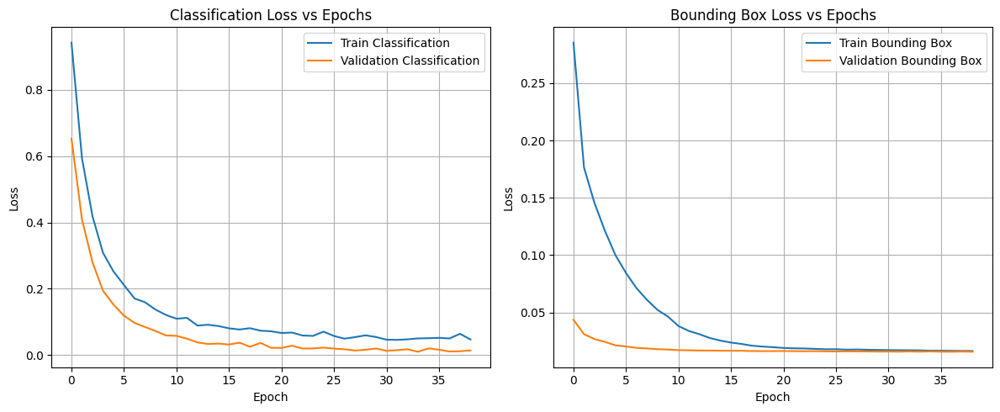

In [16]:
# ADD YOUR CODE HERE
def plot_losses(history):
    """
    Plot training and validation losses over epochs

    Args:
        history (dict): Dictionary containing training history with keys:
                       'train_cls_loss', 'train_bbox_loss',
                       'val_cls_loss', 'val_bbox_loss'
    """
    plt.figure(figsize=(12, 5))

    # Plot Classification Loss
    plt.subplot(1, 2, 1)
    plt.plot(history['train_cls_loss'], label='Train Classification')
    plt.plot(history['val_cls_loss'], label='Validation Classification')
    plt.title('Classification Loss vs Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # Plot Bounding Box Loss
    plt.subplot(1, 2, 2)
    plt.plot(history['train_bbox_loss'], label='Train Bounding Box')
    plt.plot(history['val_bbox_loss'], label='Validation Bounding Box')
    plt.title('Bounding Box Loss vs Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

# Load best model
model.load_state_dict(torch.load('best_custom_model.pth'))

# Plot training history
plot_losses(history)

## **8.2 Running Inference on the Custom Object Detection Model**

After training your **custom object detection model**, evaluate its performance by passing test images through it. Select **at least three** key evaluation metrics to assess the model’s effectiveness. Potential metrics include:

### **Key Object Detection Metrics**
- **Precision**: Measures the proportion of correctly detected objects among all predicted objects.
- **Recall**: Represents the proportion of correctly detected objects out of all actual objects present in the image.
- **F1-Score**: The harmonic mean of Precision and Recall, balancing false positives and false negatives.
- **IoU (Intersection over Union)**: Computes the ratio of overlap between the predicted bounding box and the ground truth bounding box.
- **mAP (mean Average Precision)**: A widely used metric that calculates precision at multiple recall thresholds and averages them across all object classes.

### **Additional Model Performance Metrics**
- **Inference Speed**: Measure the time taken to process a single image.
- **Number of Parameters**: Count the total trainable parameters in your model.
- **Model Size**: Evaluate the storage space required for the trained model.


```python
def test_model()
  raise NotImplementedError

def calculate_iou()
  raise NotImplementedError

def calculate_map()
  raise NotImplementedError
```

In [17]:
# ADD YOUR CODE HERE

import time
from torchvision.ops import box_iou

def calculate_iou(pred_bbox, true_bbox):
    """
    Calculate Intersection over Union between predicted and true bounding boxes

    Args:
        pred_bbox: Predicted bounding box (x, y, w, h)
        true_bbox: Ground truth bounding box (x, y, w, h)

    Returns:
        float: IoU score
    """
    # Convert (x, y, w, h) to (x1, y1, x2, y2)
    pred_x1 = pred_bbox[0] - pred_bbox[2]/2
    pred_y1 = pred_bbox[1] - pred_bbox[3]/2
    pred_x2 = pred_bbox[0] + pred_bbox[2]/2
    pred_y2 = pred_bbox[1] + pred_bbox[3]/2

    true_x1 = true_bbox[0] - true_bbox[2]/2
    true_y1 = true_bbox[1] - true_bbox[3]/2
    true_x2 = true_bbox[0] + true_bbox[2]/2
    true_y2 = true_bbox[1] + true_bbox[3]/2

    boxes1 = torch.tensor([[pred_x1, pred_y1, pred_x2, pred_y2]])
    boxes2 = torch.tensor([[true_x1, true_y1, true_x2, true_y2]])

    return box_iou(boxes1, boxes2).item()

def calculate_map(predictions, targets, iou_threshold=0.5):
    """
    Calculate mean Average Precision

    Args:
        predictions: List of predicted boxes and classes
        targets: List of ground truth boxes and classes
        iou_threshold: IoU threshold for considering a prediction correct

    Returns:
        float: mAP score
    """
    aps = []
    for class_id in range(3):  # 3 classes: Odlaw, Waldo, Whitebeard
        predictions_class = [p for p in predictions if p['class_id'] == class_id]
        targets_class = [t for t in targets if t['class_id'] == class_id]

        # Sort predictions by confidence
        predictions_class.sort(key=lambda x: x['confidence'], reverse=True)

        tp = np.zeros(len(predictions_class))
        fp = np.zeros(len(predictions_class))

        for i, pred in enumerate(predictions_class):
            best_iou = 0
            best_target_idx = -1

            for j, target in enumerate(targets_class):
                iou = calculate_iou(pred['bbox'], target['bbox'])
                if iou > best_iou:
                    best_iou = iou
                    best_target_idx = j

            if best_iou >= iou_threshold:
                tp[i] = 1
            else:
                fp[i] = 1

        # Calculate precision and recall
        cumsum_tp = np.cumsum(tp)
        cumsum_fp = np.cumsum(fp)
        recalls = cumsum_tp / len(targets_class) if len(targets_class) > 0 else np.zeros_like(cumsum_tp)
        precisions = cumsum_tp / (cumsum_tp + cumsum_fp)

        # Calculate AP using 11-point interpolation
        ap = 0
        for t in np.arange(0, 1.1, 0.1):
            if np.sum(recalls >= t) == 0:
                p = 0
            else:
                p = np.max(precisions[recalls >= t])
            ap += p / 11

        aps.append(ap)

    return np.mean(aps)

def test_model(model, test_loader, device):
    """
    Evaluate model performance on test set

    Args:
        model: Trained model
        test_loader: DataLoader for test dataset
        device: Computation device (cuda/cpu)

    Returns:
        dict: Dictionary containing various performance metrics
    """
    model.eval()
    metrics = {
        'total_time': 0,
        'num_images': 0,
        'predictions': [],
        'targets': [],
        'model_size_mb': 0
    }

    # Calculate model size
    model_size = sum(p.numel() * p.element_size() for p in model.parameters())
    metrics['model_size_mb'] = model_size / (1024 * 1024)

    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            start_time = time.time()

            # Forward pass
            pred_cls, pred_bbox = model(images)

            # Measure inference time
            batch_time = time.time() - start_time
            metrics['total_time'] += batch_time
            metrics['num_images'] += images.size(0)

            # Store predictions and targets
            for i in range(images.size(0)):
                pred = {
                    'class_id': pred_cls[i].argmax().item(),
                    'confidence': torch.softmax(pred_cls[i], dim=0).max().item(),
                    'bbox': pred_bbox[i].cpu().numpy()
                }
                target = {
                    'class_id': labels[i, 0].item(),
                    'bbox': labels[i, 1:].numpy()
                }
                metrics['predictions'].append(pred)
                metrics['targets'].append(target)

    # Calculate mAP
    metrics['mAP'] = calculate_map(metrics['predictions'], metrics['targets'])

    # Calculate IoU
    metrics['IoU'] = np.mean([calculate_iou(pred['bbox'], target['bbox']) for pred, target in zip(metrics['predictions'], metrics['targets'])])

    # Calculate average inference time per image
    metrics['avg_inference_time'] = metrics['total_time'] / metrics['num_images']

    return metrics

# Example usage
test_dataset = ObjectDetectionDataset(root_dir='dataset', split='test')
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Load best model
model.load_state_dict(torch.load('best_custom_model.pth'))
# model = trained_model
metrics = test_model(model, test_loader, device)

print(f"Model Performance Metrics:")
print(f"mAP: {metrics['mAP']:.4f}")
print(f"iOU: {metrics['IoU']:.4f}")
print(f"Average Inference Time: {metrics['avg_inference_time']*1000:.2f}ms per image")
print(f"Model Size: {metrics['model_size_mb']:.2f}MB")

<ipython-input-17-872a5928c5e3>:158: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_custom_model.pth'))


Model Performance Metrics:
mAP: 0.9697
iOU: 0.2110
Average Inference Time: 0.12ms per image
Model Size: 43.65MB


## **8.3 Visualizing Model Predictions**
- Select a set of test images and display them with **predicted bounding boxes** overlaid.
- Compare predictions against the **ground truth bounding boxes** to visually assess model accuracy.
- Annotate each prediction with relevant metrics (Precision, Recall, IoU) to highlight how well the model performs.

For detailed tracking and logging, consider using **Weights and Biases (WandB)** or **TensorBoard** to visualize training progress, compare models, and gain deeper insights into your results.

<ipython-input-18-10b1bcbcb013>:129: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_custom_model.pth'))
<ipython-input-18-10b1bcbcb013>

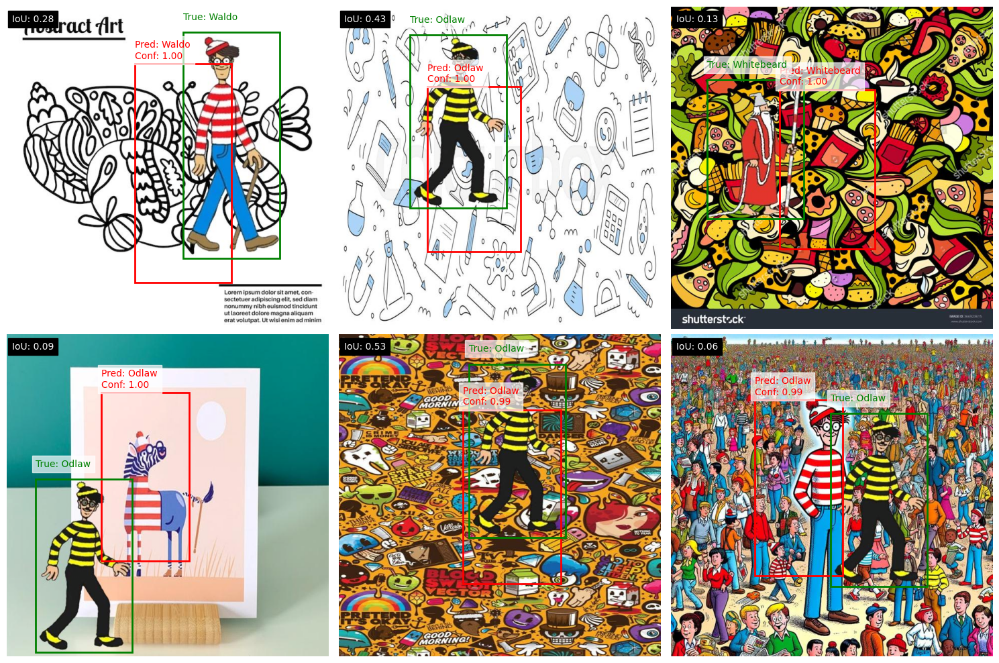

In [18]:
import matplotlib.pyplot as plt
import torch
import numpy as np
from torchvision import transforms

def visualize_predictions(model, test_dataset, num_samples=6, device='cuda'):
    """
    Visualize model predictions alongside ground truth boxes
    Args:
        model: Trained object detection model
        test_dataset: Test dataset
        num_samples: Number of images to visualize
        device: Computation device
    """
    model.eval()
    # Create figure
    plt.figure(figsize=(15, 10))
    # Class names for labels
    class_names = ['Odlaw', 'Waldo', 'Whitebeard']
    # Reverse normalization for display
    reverse_normalize = transforms.Normalize(
        mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
        std=[1/0.229, 1/0.224, 1/0.225]
    )
    
    with torch.no_grad():
        for idx in range(num_samples):
            # Get sample
            image, label = test_dataset[idx]
            # Get predictions
            image_tensor = image.unsqueeze(0).to(device)
            pred_cls, pred_bbox = model(image_tensor)
            
            # Convert prediction to numpy
            pred_class = pred_cls[0].argmax().item()
            pred_conf = torch.softmax(pred_cls[0], dim=0).max().item()
            pred_box = pred_bbox[0].cpu().numpy()
            
            # Get ground truth
            true_class = int(label[0])
            true_box = label[1:].numpy()
            
            # Calculate IoU
            iou = calculate_iou(pred_box, true_box)
            
            # Prepare image for display
            img_display = reverse_normalize(image).permute(1, 2, 0).cpu().numpy()
            
            # Create subplot
            plt.subplot(2, 3, idx + 1)
            plt.imshow(img_display)
            
            # Get image dimensions
            img_height, img_width = img_display.shape[:2]
            
            # Draw predicted box
            pred_x = (pred_box[0] - pred_box[2]/2) * img_width
            pred_y = (pred_box[1] - pred_box[3]/2) * img_height
            pred_box_width = pred_box[2] * img_width
            pred_box_height = pred_box[3] * img_height
            
            pred_rect = plt.Rectangle(
                (pred_x, pred_y),
                pred_box_width,
                pred_box_height,
                fill=False,
                edgecolor='red',
                linewidth=2
            )
            plt.gca().add_patch(pred_rect)
            
            # Draw ground truth box
            true_x = (true_box[0] - true_box[2]/2) * img_width
            true_y = (true_box[1] - true_box[3]/2) * img_height
            true_box_width = true_box[2] * img_width
            true_box_height = true_box[3] * img_height
            
            true_rect = plt.Rectangle(
                (true_x, true_y),
                true_box_width,
                true_box_height,
                fill=False,
                edgecolor='green',
                linewidth=2
            )
            plt.gca().add_patch(true_rect)
            
            # Add text for prediction
            plt.text(
                pred_x, 
                pred_y - 10, 
                f'Pred: {class_names[pred_class]}\nConf: {pred_conf:.2f}',
                color='red', 
                fontsize=10,
                bbox=dict(facecolor='black', alpha=0.7, color='white')
            )
            
            # Add text for ground truth
            plt.text(
                true_x, 
                true_y - 25, 
                f'True: {class_names[true_class]}',
                color='green', 
                fontsize=10,
                bbox=dict(facecolor='black', alpha=0.7, color='white')
            )
            
            # Add IoU text
            plt.text(
                10, 
                30, 
                f'IoU: {iou:.2f}',
                color='white', 
                fontsize=10,
                bbox=dict(facecolor='black', alpha=1)
            )
            
            plt.axis('off')
    
    plt.tight_layout()
    plt.savefig('prediction_results.png')
    plt.show()

# Load and visualize predictions
def analyze_predictions():
    """Run prediction visualization"""
    # Load best model
    global model
    model.load_state_dict(torch.load('best_custom_model.pth'))
    model = model.to(device)
    
    # Create test dataset
    test_dataset = ObjectDetectionDataset(
        root_dir='dataset',
        split='test'
    )
    
    # Visualize predictions
    visualize_predictions(model, test_dataset)

# Run the analysis
analyze_predictions()

## **9. Loading an Existing Object Detection Model (YOLOvX)**

You are free to select any YOLO model version available. We recommend referring to the **Ultralytics documentation** on object detection: [Ultralytics YOLO Docs](https://docs.ultralytics.com/tasks/detect/).

Training a YOLO model is straightforward and requires a properly formatted **`data.yaml`** file, which defines dataset paths and classes. Refer to the **official GitHub repository** for detailed instructions: [Ultralytics GitHub](https://github.com/ultralytics/ultralytics).

Once your dataset is prepared, you can initiate training directly from the command line using a simple command:

```bash
!yolo detect train data=datasets/data.yaml model=yolov11n.pt epochs=100 imgsz=640
```

A `data.yaml` might look something like this:
```python
with open('dataset/data.yaml', 'w') as f:
        f.write("path:  \ntrain: content/dataset/train/images \nval: content/dataset/val/images \ntest: content/dataset/test/images \n")
        f.write("nc: 3 \n")
        f.write("names:\n  0: wilma\n  1: waldo\n  2: wenda\n")
        f.write('\n')
f.close()
```

In [19]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.8/949.8 kB 19.7 MB/s eta 0:00:0000:01


In [21]:
# ADD YOUR CODE HERE

from ultralytics import YOLO
import yaml

def setup_yolo_training():

    # Create data.yaml
    data_config = {
        'path': '/kaggle/working/dataset/background',  # Updated path
        'train': 'train/images',
        'val': 'val/images',
        'test': 'test/images',
        'nc': 3,
        'names': ['Odlaw', 'Waldo', 'Whitebeard']
    }

    # Save configuration
    with open('/kaggle/working/data.yaml', 'w') as f:
        yaml.dump(data_config, f, default_flow_style=False)

    # Initialize YOLO model
    model = YOLO('yolov8n.pt')  # Load YOLOv8 nano model

    # Train model
    results = model.train(
        data='data.yaml',
        epochs=50,
        imgsz=640,
        batch=16,
        name='waldo_odlaw_whitebeard_detector'
    )

    return model, results


# Train model
model, results = setup_yolo_training()

# Save model
model.save('/kaggle/working/best_yolo.pt')


Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=waldo_odlaw_whitebeard_detector2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show

100%|██████████| 755k/755k [00:00<00:00, 31.1MB/s]


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 129MB/s]
/usr/local/lib/python3.10/dist-packages/ultralytics/utils/torch_utils.py:260: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  fusedconv.weight.copy_(torch.mm(w_bn, w_conv).view(fusedconv.weight.shape))
/usr/local/lib/python3.10/dist-packages/ultralytics/utils/torch_utils.py:265: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context:

AMP: checks passed ✅


train: Scanning /kaggle/working/dataset/background/train/labels... 5000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5000/5000 [00:03<00:00, 1282.45it/s]


train: New cache created: /kaggle/working/dataset/background/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.5 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /kaggle/working/dataset/background/val/labels... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<00:00, 1166.47it/s]


val: New cache created: /kaggle/working/dataset/background/val/labels.cache
Plotting labels to runs/detect/waldo_odlaw_whitebeard_detector2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/waldo_odlaw_whitebeard_detector2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       1/50      2.77G     0.7238      1.382      1.078         19        640: 100%|██████████| 313/313 [01:00<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000      0.999          1      0.995      0.928

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       2/50      2.77G     0.4779     0.5725     0.9253         14        640: 100%|██████████| 313/313 [00:57<00:00,  5.44it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000      0.999          1      0.995      0.961



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       3/50      2.78G     0.4218     0.4228     0.9164         14        640: 100%|██████████| 313/313 [00:56<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995       0.97



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       4/50      2.78G     0.3922     0.3597     0.8996         12        640: 100%|██████████| 313/313 [00:56<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000      0.999      0.998      0.995       0.99



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       5/50      2.78G     0.3409     0.3146     0.8823         15        640: 100%|██████████| 313/313 [00:56<00:00,  5.55it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1      0.999      0.995      0.989



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       6/50      2.78G     0.3137     0.2893     0.8767         14        640: 100%|██████████| 313/313 [00:56<00:00,  5.54it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000      0.999          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       7/50      2.78G     0.3017     0.2715     0.8726         10        640: 100%|██████████| 313/313 [00:56<00:00,  5.57it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000      0.999          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       8/50      2.78G     0.2787     0.2554     0.8684         12        640: 100%|██████████| 313/313 [00:56<00:00,  5.54it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       9/50      2.78G     0.2743     0.2498     0.8685         14        640: 100%|██████████| 313/313 [00:56<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      10/50      2.78G     0.2605     0.2416     0.8646          8        640: 100%|██████████| 313/313 [00:56<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      11/50      2.78G     0.2495     0.2318      0.859         16        640: 100%|██████████| 313/313 [00:56<00:00,  5.55it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      12/50      2.78G     0.2353     0.2194     0.8547         15        640: 100%|██████████| 313/313 [00:56<00:00,  5.53it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      13/50      2.78G     0.2319     0.2178     0.8577         17        640: 100%|██████████| 313/313 [00:56<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      14/50      2.78G      0.227      0.214     0.8546         21        640: 100%|██████████| 313/313 [00:56<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      15/50      2.78G      0.225     0.2134     0.8559         12        640: 100%|██████████| 313/313 [00:56<00:00,  5.53it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      16/50      2.78G     0.2158     0.2041     0.8522         20        640: 100%|██████████| 313/313 [00:56<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      17/50      2.78G     0.2113     0.2028     0.8544         20        640: 100%|██████████| 313/313 [00:56<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      18/50      2.78G     0.2056     0.1923      0.851         19        640: 100%|██████████| 313/313 [00:56<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      19/50      2.78G     0.1966     0.1914     0.8529         15        640: 100%|██████████| 313/313 [00:56<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      20/50      2.78G     0.1895     0.1844     0.8483         21        640: 100%|██████████| 313/313 [00:57<00:00,  5.49it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      21/50      2.78G     0.1886     0.1826     0.8472         17        640: 100%|██████████| 313/313 [00:56<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      22/50      2.78G     0.1803     0.1742     0.8468         11        640: 100%|██████████| 313/313 [00:56<00:00,  5.53it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      23/50      2.78G     0.1822     0.1761     0.8426         19        640: 100%|██████████| 313/313 [00:56<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      24/50      2.78G     0.1792     0.1749     0.8449         19        640: 100%|██████████| 313/313 [00:56<00:00,  5.54it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      25/50      2.78G     0.1728     0.1711     0.8459         14        640: 100%|██████████| 313/313 [00:56<00:00,  5.54it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      26/50      2.78G     0.1685     0.1623     0.8429         17        640: 100%|██████████| 313/313 [00:56<00:00,  5.54it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      27/50      2.78G     0.1627     0.1614     0.8423         16        640: 100%|██████████| 313/313 [00:56<00:00,  5.55it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      28/50      2.78G      0.162     0.1582     0.8426         21        640: 100%|██████████| 313/313 [00:56<00:00,  5.55it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      29/50      2.78G     0.1612     0.1571     0.8415         16        640: 100%|██████████| 313/313 [00:56<00:00,  5.53it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      30/50      2.78G     0.1565     0.1541     0.8407         17        640: 100%|██████████| 313/313 [00:56<00:00,  5.53it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      31/50      2.78G     0.1538     0.1534     0.8412         15        640: 100%|██████████| 313/313 [00:56<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      32/50      2.78G      0.154     0.1519     0.8402         16        640: 100%|██████████| 313/313 [00:56<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      33/50      2.78G     0.1446      0.148     0.8392         19        640: 100%|██████████| 313/313 [00:56<00:00,  5.54it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      34/50      2.78G     0.1458     0.1463     0.8385         15        640: 100%|██████████| 313/313 [00:56<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      35/50      2.78G     0.1428     0.1443     0.8394         13        640: 100%|██████████| 313/313 [00:56<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      36/50      2.78G     0.1369     0.1393     0.8374         17        640: 100%|██████████| 313/313 [00:56<00:00,  5.53it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      37/50      2.78G     0.1365     0.1368     0.8353         13        640: 100%|██████████| 313/313 [00:56<00:00,  5.52it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      38/50      2.78G     0.1294     0.1342     0.8366         15        640: 100%|██████████| 313/313 [00:56<00:00,  5.51it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      39/50      2.78G     0.1296     0.1331     0.8387         12        640: 100%|██████████| 313/313 [00:56<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      40/50      2.78G     0.1269     0.1302     0.8346         15        640: 100%|██████████| 313/313 [00:56<00:00,  5.50it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      41/50      2.78G       0.08    0.08127     0.7844          8        640: 100%|██████████| 313/313 [00:57<00:00,  5.44it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      42/50      2.78G    0.07917    0.08018     0.7859          8        640: 100%|██████████| 313/313 [00:56<00:00,  5.58it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      43/50      2.78G     0.0734    0.07496     0.7876          8        640: 100%|██████████| 313/313 [00:56<00:00,  5.56it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      44/50      2.78G    0.06984    0.07237     0.7833          8        640: 100%|██████████| 313/313 [00:56<00:00,  5.56it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      45/50      2.78G    0.06527    0.06753     0.7806          8        640: 100%|██████████| 313/313 [00:56<00:00,  5.59it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      46/50      2.78G     0.0616    0.06274     0.7825          8        640: 100%|██████████| 313/313 [00:56<00:00,  5.55it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      47/50      2.78G    0.05936    0.06105     0.7854          8        640: 100%|██████████| 313/313 [00:56<00:00,  5.54it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      48/50      2.78G    0.05545    0.05835     0.7842          8        640: 100%|██████████| 313/313 [00:56<00:00,  5.55it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      49/50      2.78G    0.05281    0.05525     0.7822          8        640: 100%|██████████| 313/313 [00:56<00:00,  5.58it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/313 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:196: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      50/50      2.78G    0.05142    0.05389     0.7823          8        640: 100%|██████████| 313/313 [00:56<00:00,  5.57it/s]
                 Class     Images  Instances      Box(P          R   

                   all       1000       1000          1          1      0.995      0.995



50 epochs completed in 0.865 hours.
Optimizer stripped from runs/detect/waldo_odlaw_whitebeard_detector2/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/waldo_odlaw_whitebeard_detector2/weights/best.pt, 6.2MB

Validating runs/detect/waldo_odlaw_whitebeard_detector2/weights/best.pt...
Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 72 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


/usr/local/lib/python3.10/dist-packages/ultralytics/utils/torch_utils.py:260: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  fusedconv.weight.copy_(torch.mm(w_bn, w_conv).view(fusedconv.weight.shape))
/usr/local/lib/python3.10/dist-packages/ultralytics/utils/torch_utils.py:265: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operati

                   all       1000       1000          1          1      0.995      0.995
                 Odlaw        330        330          1          1      0.995      0.995
                 Waldo        332        332          1          1      0.995      0.995
            Whitebeard        338        338          1          1      0.995      0.995


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 1.9ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs/detect/waldo_odlaw_whitebeard_detector2



0: 640x640 1 Waldo, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Waldo, 6.7ms
Speed: 1.7ms preprocess, 6.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Odlaw, 6.5ms
Speed: 1.9ms preprocess, 6.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Waldo, 6.6ms
Speed: 1.8ms preprocess, 6.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Waldo, 6.7ms
Speed: 1.7ms preprocess, 6.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Whitebeard, 6.5ms
Speed: 1.6ms preprocess, 6.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


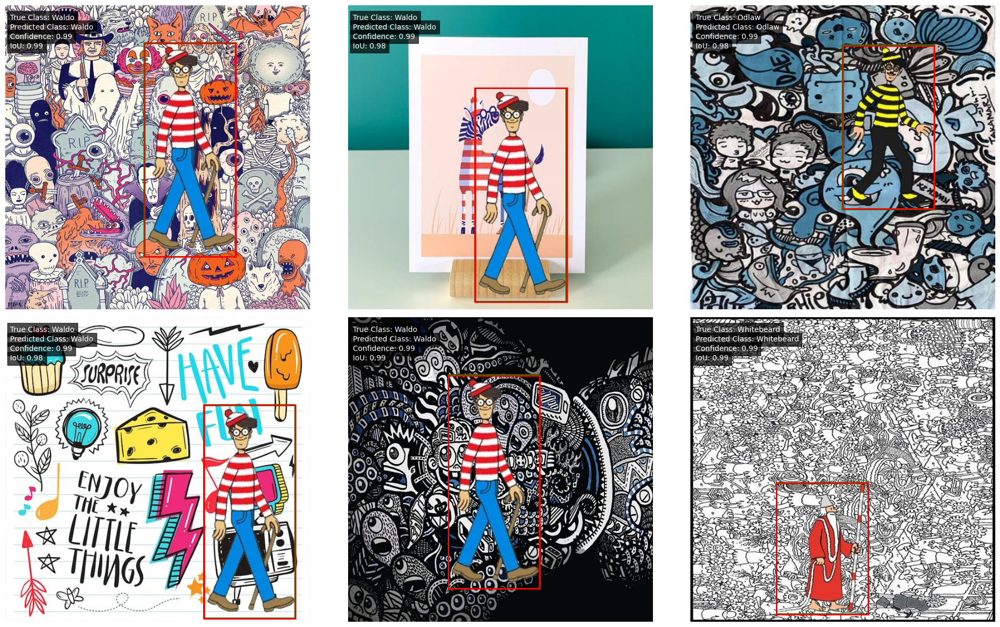

In [42]:
def calculate_iou(box1, box2):
    """
    Calculate Intersection over Union (IoU) between two bounding boxes
    
    Args:
        box1 (np.ndarray or torch.Tensor): First bounding box [x1, y1, x2, y2]
        box2 (np.ndarray or torch.Tensor): Second bounding box [x1, y1, x2, y2]
    
    Returns:
        float: IoU value
    """
    # Convert to numpy if needed
    box1 = box1.cpu().numpy() if torch.is_tensor(box1) else box1
    box2 = box2.cpu().numpy() if torch.is_tensor(box2) else box2

    # Calculate coordinates of intersection rectangle
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    # Calculate area of intersection
    intersection = max(0, x2 - x1) * max(0, y2 - y1)

    # Calculate area of both boxes
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])

    # Calculate union
    union = box1_area + box2_area - intersection

    # Calculate IoU
    iou = intersection / union if union > 0 else 0
    return iou

def tensor_to_numpy(tensor):
    """Convert tensor image to numpy image"""
    if tensor.dim() == 4:
        tensor = tensor.squeeze(0)
    
    tensor = tensor.cpu()
    
    if tensor.min() < 0 or tensor.max() > 1:
        mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
        tensor = tensor * std + mean
    
    tensor = torch.clamp(tensor * 255, 0, 255)
    image = tensor.permute(1, 2, 0).numpy().astype(np.uint8)
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    
    return image

def visualize_custom_yolo_predictions(model_path, test_dataset, num_samples=6, device='cuda'):
    """
    Visualize predictions from a custom trained YOLO model with ground truth and IoU
    """
    # Load the custom trained model
    model = YOLO(model_path)

    # Create figure
    plt.figure(figsize=(20, 12))

    # Determine input type and get image function
    def get_image(idx):
        item = test_dataset[idx]
        
        # Handle different input types
        if isinstance(item, tuple) or isinstance(item, list):
            # Assume first element is image, second is label/ground truth
            return item[0], item[1]
        elif isinstance(item, torch.Tensor):
            return tensor_to_numpy(item), None
        else:
            return item, None

    # Iterate through samples
    for idx in range(min(num_samples, len(test_dataset))):
        # Get image and ground truth
        image, ground_truth = get_image(idx)
        
        # Convert image to RGB for display
        if isinstance(image, torch.Tensor):
            image = tensor_to_numpy(image)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Run inference
        results = model(image)

        # Create subplot
        plt.subplot(2, 3, idx + 1)
        plt.imshow(image_rgb)

        # Process ground truth if available
        true_class = "Unknown"
        if ground_truth is not None:
            # Extract ground truth box (assuming [cls, x, y, w, h] format)
            gt_cls = int(ground_truth[0].item())
            true_class = model.names[gt_cls]  # Get class name from model
            gt_box = ground_truth[1:].cpu().numpy()
            
            # Convert normalized coordinates to pixel coordinates
            img_height, img_width = image.shape[:2]
            gt_x1 = int((gt_box[0] - gt_box[2]/2) * img_width)
            gt_y1 = int((gt_box[1] - gt_box[3]/2) * img_height)
            gt_x2 = int((gt_box[0] + gt_box[2]/2) * img_width)
            gt_y2 = int((gt_box[1] + gt_box[3]/2) * img_height)
            
            # Draw ground truth box
            plt.gca().add_patch(plt.Rectangle(
                (gt_x1, gt_y1), 
                gt_x2 - gt_x1, 
                gt_y2 - gt_y1, 
                fill=False, 
                edgecolor='green', 
                linewidth=2,
                label='Ground Truth'
            ))

        # Process model predictions
        best_iou = 0
        best_pred = None
        predicted_class = "No Detection"
        for result in results:
            boxes = result.boxes

            for box in boxes:
                # Extract box coordinates
                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
                
                # Get confidence and class
                conf = box.conf.item()
                cls = int(box.cls.item())
                pred_class = model.names[cls]
                
                # Draw prediction box
                pred_rect = plt.Rectangle(
                    (x1, y1), 
                    x2 - x1, 
                    y2 - y1, 
                    fill=False, 
                    edgecolor='red', 
                    linewidth=2
                )
                plt.gca().add_patch(pred_rect)

                # Calculate IoU if ground truth exists
                if ground_truth is not None:
                    # Convert ground truth to [x1, y1, x2, y2] format
                    iou = calculate_iou(
                        [gt_x1, gt_y1, gt_x2, gt_y2], 
                        [x1, y1, x2, y2]
                    )
                    
                    # Track best IoU prediction
                    if iou > best_iou:
                        best_iou = iou
                        best_pred = {
                            'box': [x1, y1, x2, y2],
                            'class': pred_class,
                            'confidence': conf
                        }
                        predicted_class = pred_class

        # Add text for class comparison and best prediction
        plt.text(
            10, 30, 
            f'True Class: {true_class}',
            color='white', 
            fontsize=10,
            bbox=dict(facecolor='black', alpha=0.7)
        )
        plt.text(
            10, 50, 
            f'Predicted Class: {predicted_class}',
            color='white', 
            fontsize=10,
            bbox=dict(facecolor='black', alpha=0.7)
        )

        if best_pred:
            plt.text(
                10, 70, 
                f'Confidence: {best_pred["confidence"]:.2f}',
                color='white', 
                fontsize=10,
                bbox=dict(facecolor='black', alpha=0.7)
            )
            plt.text(
                10, 90, 
                f'IoU: {best_iou:.2f}',
                color='white', 
                fontsize=10,
                bbox=dict(facecolor='black', alpha=0.7)
            )

        plt.axis('off')
    
    plt.tight_layout()
    plt.savefig('custom_yolo_prediction_class_iou_results.png')
    plt.show()

def analyze_custom_yolo_predictions():
    """Run prediction visualization for custom trained YOLO model"""
    # Path to your saved model
    model_path = 'best_yolo.pt'
    
    # Create test dataset
    test_dataset = ObjectDetectionDataset(
        root_dir='dataset',
        split='test'
    )
    
    # Visualize predictions
    visualize_custom_yolo_predictions(model_path, test_dataset)

# Run the analysis
analyze_custom_yolo_predictions()

## **10. Evaluating the YOLO Model**

Ensure that you **log and visualize training losses** and **evaluation metrics** throughout the training process. YOLO models typically provide verbose output by default, but you should also generate visualizations to track performance trends effectively.

In [57]:
def calculate_iou(box1, box2):
    """
    Calculate Intersection over Union (IoU) between two bounding boxes
    
    Args:
    - box1 (torch.Tensor): First bounding box [x1, y1, x2, y2]
    - box2 (torch.Tensor): Second bounding box [x1, y1, x2, y2]
    
    Returns:
    - float: IoU value
    """
    # Calculate intersection coordinates
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])
    
    # Calculate intersection area
    intersection = max(0, x2 - x1) * max(0, y2 - y1)
    
    # Calculate union area
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = box1_area + box2_area - intersection
    
    # Calculate IoU
    iou = intersection / union if union > 0 else 0
    return iou

def simple_evaluate_model(model_path, test_image_dir, label_dir):
    """
    Evaluate YOLO model with detection and IoU calculation
    
    Args:
    - model_path (str): Path to the trained YOLO model
    - test_image_dir (str): Directory containing test images
    - label_dir (str): Directory containing ground truth labels
    """
    # Load the YOLO model
    model = YOLO(model_path)
    
    # List all image files in the test directory
    image_files = [
        f for f in os.listdir(test_image_dir) 
        if f.lower().endswith(('.png', '.jpg', '.jpeg'))
    ]
    
    print(f"Total test images found: {len(image_files)}")
    
    # Tracking detection statistics
    total_detections = 0
    images_with_detections = 0
    ious = []
    
    # Evaluate each image
    for image_file in image_files:
        # Construct full paths
        image_path = os.path.join(test_image_dir, image_file)
        label_path = os.path.join(label_dir, os.path.splitext(image_file)[0] + '.txt')
        
        # Run inference
        results = model(image_path)
        
        # Read ground truth labels
        ground_truth = []
        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                for line in f:
                    # Parse YOLO format: class x_center y_center width height
                    parts = list(map(float, line.strip().split()))
                    ground_truth.append(parts)
        
        # Process results
        for result in results:
            # Get detected boxes
            boxes = result.boxes
            
            if len(boxes) > 0:
                images_with_detections += 1
                total_detections += len(boxes)
                
                # Convert YOLO detections to xyxy format
                for box in boxes:
                    cls = int(box.cls[0])
                    conf = float(box.conf[0])
                    bbox = box.xyxy[0].cpu().numpy()  # [x1, y1, x2, y2]
                    
                    # Calculate IoU with ground truth
                    for gt in ground_truth:
                        # Convert ground truth to xyxy format
                        img_h, img_w = result.orig_img.shape[:2]
                        gt_cls = int(gt[0])
                        gt_x_center, gt_y_center, gt_width, gt_height = gt[1:]
                        
                        # Convert normalized coordinates to pixel coordinates
                        gt_x1 = (gt_x_center - gt_width/2) * img_w
                        gt_y1 = (gt_y_center - gt_height/2) * img_h
                        gt_x2 = (gt_x_center + gt_width/2) * img_w
                        gt_y2 = (gt_y_center + gt_height/2) * img_h
                        
                        gt_bbox = [gt_x1, gt_y1, gt_x2, gt_y2]
                        
                        # Calculate IoU
                        iou = calculate_iou(bbox, gt_bbox)
                        ious.append(iou)
                        
                        print(f"Image: {image_file}, "
                              f"Pred Class: {cls}, GT Class: {gt_cls}, "
                              f"Confidence: {conf:.2f}, IoU: {iou:.2f}")
    
    # Print summary
    print("\n--- Evaluation Summary ---")
    print(f"Total Images Processed: {len(image_files)}")
    print(f"Images with Detections: {images_with_detections}")
    print(f"Total Detections: {total_detections}")
    print(f"Detection Rate: {images_with_detections/len(image_files)*100:.2f}%")
    
    # IoU statistics
    if ious:
        print(f"Mean IoU: {np.mean(ious):.4f}")
        print(f"Median IoU: {np.median(ious):.4f}")
        print(f"IoU Standard Deviation: {np.std(ious):.4f}")

# Example usage
model_path = '/kaggle/working/best_yolo.pt'
test_image_dir = '/kaggle/working/dataset/background/test/images'
test_label_dir = '/kaggle/working/dataset/background/test/labels'

simple_evaluate_model(model_path, test_image_dir, test_label_dir)

Total test images found: 200

image 1/1 /kaggle/working/dataset/background/test/images/00014.jpg: 640x640 1 Waldo, 6.6ms
Speed: 1.3ms preprocess, 6.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
Image: 00014.jpg, Pred Class: 1, GT Class: 1, Confidence: 0.99, IoU: 1.00

image 1/1 /kaggle/working/dataset/background/test/images/00044.jpg: 640x640 1 Odlaw, 5.7ms
Speed: 1.4ms preprocess, 5.7ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)
Image: 00044.jpg, Pred Class: 0, GT Class: 0, Confidence: 0.99, IoU: 1.00

image 1/1 /kaggle/working/dataset/background/test/images/00159.jpg: 640x640 1 Waldo, 5.7ms
Speed: 1.2ms preprocess, 5.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Image: 00159.jpg, Pred Class: 1, GT Class: 1, Confidence: 0.99, IoU: 1.00

image 1/1 /kaggle/working/dataset/background/test/images/00128.jpg: 640x640 1 Whitebeard, 5.8ms
Speed: 1.3ms preprocess, 5.8ms inference, 1.0ms postprocess per image at shape (1, 3, 64

Please make sure to download your `.ipynb` file, and upload it to **Canvas** on time!

<img src="https://www.usatoday.com/gcdn/authoring/authoring-images/2023/08/25/USAT/70680172007-alertsm.png?crop=2099,1187,x0,y156" alt="1" border="0">



In [32]:
# @title ⏰ Time Left Until Submission ⏰
# %%capture flowchart_output
# HIDDEN CELL

from datetime import datetime, timedelta

deadline = datetime(2025, 4, 3, 23, 59, 0)

def time_until_deadline():
    now = datetime.utcnow()
    remaining = deadline - now
    if remaining.total_seconds() <= 0:
        return "Time's up!"
    days = remaining.days
    hours, remainder = divmod(remaining.seconds, 3600)
    minutes, _ = divmod(remainder, 60)

    return f"{days} days, {hours} hours, {minutes} minutes"

print("Time left until submission:", time_until_deadline())

Time left until submission: 6 days, 23 hours, 55 minutes
